# Leaflet widget to visualize sonoma county layers

In [1]:
import pandas as pd
import geopandas as gpd
import folium
import branca.colormap as cm
import matplotlib.pyplot as plt

In [2]:
# Administrative boundaries
soco_bound = gpd.read_file("../data/clean/sonoma_county_boundary/sonoma_county_boundary.shp")

# Ecoregions
ecoregion = gpd.read_file("../data/clean/soco_ecoregion_l4/soco_ecoregion_l4.shp")

# read in VL data
croplands = gpd.read_file("../data/raw/Vital_Lands_Data_Package/VLI_Priority_Ag_Croplands.shp")
grazinglands = gpd.read_file("../data/raw/Vital_Lands_Data_Package/VLI_Priority_Ag_Grazing_Land.shp")

# read in hazard data
flood_plains = gpd.read_file("../data/clean/flood_awareness_areas/flood_awareness_areas.shp")
wildfire_risk = gpd.read_file("../data/clean/soco_wildfire_risk_index/Wildfire_Risk_Index.shp")
slr_75 = gpd.read_file("../data/clean/fldhazd_slr75_w000/all_fldhazd_slr75_w000.shp")
slr_75_100 = gpd.read_file("../data/clean/fldhazd_slr75_w100/all_fldhazd_slr75_w100.shp")
slr_200 = gpd.read_file("../data/clean/fldhazd_slr200_w000/all_fldhazd_slr200_w000.shp")
ls_risk = gpd.read_file("../data/clean/soco_landslide_risk/ls_risk_simp.shp")

In [3]:
# wildfire data cleaning
wildfire_risk["risk_5_rank"] = wildfire_risk["TOTAL_RANK"] / 9
wildfire_risk["risk_5_rank"] = wildfire_risk["risk_5_rank"].round(0)

#### Simplify layers and reproject to the same crs

In [4]:
# floodplains
flood_plains_simp = flood_plains.simplify(tolerance = 10)

# Vital lands
croplands_simp = croplands.dissolve(by="MAP_CLASS").simplify(tolerance = 100)
grazinglands_simp = grazinglands.dissolve(by="LIFEFORM").simplify(tolerance = 100)

# Fire risk
fire_risk_simp = wildfire_risk.to_crs(epsg=2226).dissolve(by="risk_5_rank")
fire_risk_simp['risk_rank'] = fire_risk_simp.index.values

# Sea level Rise
slr_75_simp = slr_75.to_crs(epsg=2226).dissolve().simplify(tolerance = 100)
slr_75_100_simp = slr_75_100.to_crs(epsg=2226).dissolve().simplify(tolerance = 100)
slr_200_simp = slr_200.to_crs(epsg=2226).dissolve().simplify(tolerance = 100)

# Landslide Risk
ls_risk_simp = ls_risk.simplify(tolerance = 100)
ls_risk.geometry = ls_risk_simp # replace geometry with simplified geometry

# EPA Ecoregion
ecoregion = ecoregion.to_crs(epsg=2226)

In [13]:
#create color map for wildfire risk
col_wr = cm.linear.YlOrRd_05.to_step(5)
col_wr.caption = "Fire risk index"


In [16]:
# create the map
m = folium.Map(location=[38.53483770528745, -122.90496820959295])
#folium.GeoJson(croplands_simp, name="Crop lands", style_function=lambda x: {'fillColor': 'brown', 'color': 'brown', 'fillOpacity': 1}).add_to(m)
#folium.GeoJson(grazinglands_simp, name="Grazing lands", style_function=lambda x: {'fillColor': 'green', 'color': 'green', 'fillOpacity': 1}).add_to(m)
folium.GeoJson(flood_plains_simp, name="Flood Plains").add_to(m)
folium.GeoJson(slr_200_simp, name="200cm SLR", style_function=lambda x: {'fillColor': '#6497b1', 'color': '#6497b1', 'fillOpacity': 0.6}).add_to(m)
folium.GeoJson(slr_75_100_simp, name="75cm + 100yr SLR", style_function=lambda x: {'fillColor': '#005b96', 'color': '#005b96', 'fillOpacity': 0.6}).add_to(m)
folium.GeoJson(slr_75_simp, name="75cm SLR", style_function=lambda x: {'fillColor': '#011f4b', 'color': '#011f4b', 'fillOpacity': 0.6}).add_to(m)
folium.GeoJson(fire_risk_simp,
                name="Wildfire Risk Index",
                style_function=lambda x: {"weight":0.5, 
                                            'color':'black',
                                            'fillColor':col_wr(x['properties']['risk_rank'] / 5),
                                            'color':col_wr(x['properties']['risk_rank'] / 5), 
                                            'fillOpacity':0.7},
                ).add_to(m) 
folium.GeoJson(ecoregion, name="Ecoregions", style_function=lambda x: {'fillColor': 'white', 'color': 'black', 'fillOpacity': 0}, 
               tooltip=folium.features.GeoJsonTooltip(fields=['US_L4NAME'], aliases=['EPA Ecoregion: ']),
               highlight_function = lambda x: {'color': '#00FFFF'}).add_to(m)
folium.LayerControl().add_to(m)
#col_wr.add_to(m)
m

In [17]:
m.save("../output/interactive/hazards_ecoregion.html")

<AxesSubplot:>

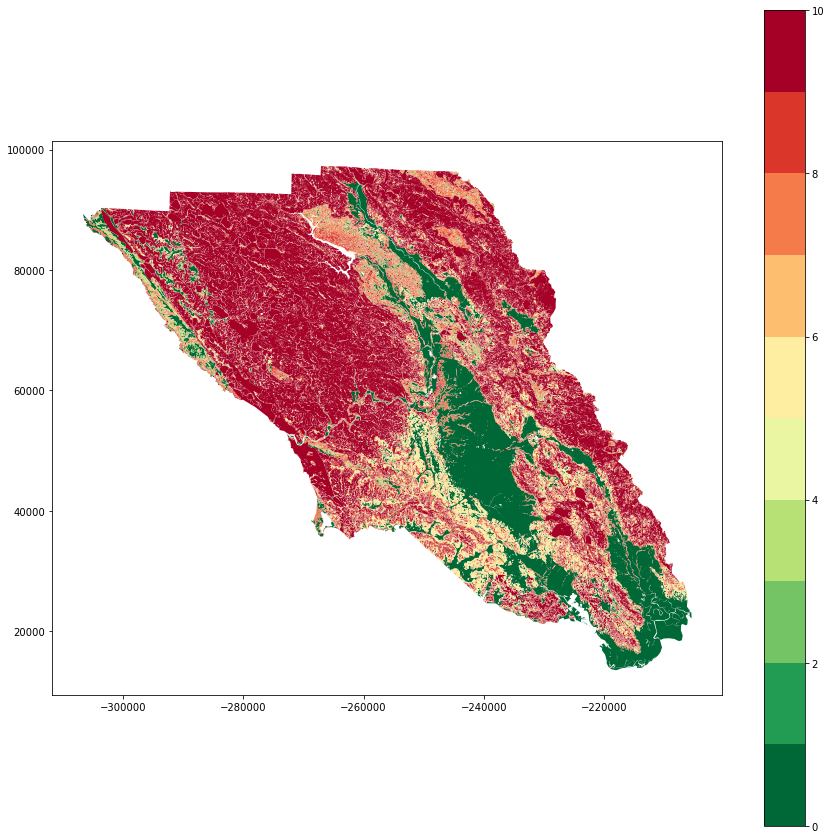

In [24]:
### Landslide risk is too detailed to put in the interactive map so just do static plot

#create color map for landslide risk
#col_lr = cm.linear.RdYlGn_10.to_step(10)
#col_lr.caption = "Landslide Risk"

fig, ax = plt.subplots(figsize=(15,15))
ls_risk.plot(ax=ax, column = "risk", cmap = plt.cm.get_cmap('RdYlGn_r', 10), legend = True)